In [4]:
# Model define & Initialize
import torch
from torch.utils.data import Dataset, DataLoader

import numpy as np
import pandas as pd
from pathlib import Path

from PIL import Image

from typing import Callable, List, Optional, Union, Tuple

from diffusers import StableDiffusionPipeline

CompVis_id = ["CompVis/stable-diffusion-v1-1", "CompVis/stable-diffusion-v1-2", "CompVis/stable-diffusion-v1-3", "CompVis/stable-diffusion-v1-4",\
             "CompVis/stable-diffusion-v-1-1-original", "CompVis/stable-diffusion-v-1-2-original", "CompVis/stable-diffusion-v-1-3-original", "CompVis/stable-diffusion-v-1-4-original"]

runwayml = ["runwayml/stable-diffusion-v1-5"]

model = StableDiffusionPipeline.from_pretrained(
	CompVis_id[0], 
	use_auth_token=True
).to("cuda")
model.pretrained_weight = CompVis_id[0]

csv_folder = Path("/mnt/nas65/Dataset/ImageNet1K/ILSVRC/Data/CLS-LOC/train_csv")

vae/diffusion_pytorch_model.safetensors not found
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [5]:
model.pretrained_weight

'CompVis/stable-diffusion-v1-1'

In [6]:
model.pretrained_model_name

AttributeError: 'StableDiffusionPipeline' object has no attribute 'pretrained_model_name'

In [2]:
# ImageCaptionPairDataset
class ICP_Dataset(Dataset):
    def __init__(self, csv_folder_path: Path, save_image_folder_name: Path):
        self.csv_list = list(csv_folder_path.glob("*.csv"))
        self.save_image_path = Path("/home/datasets/ImageNet1K/ILSVRC/Data/CLS-LOC/").joinpath(save_image_folder_name)
        self.save_image_path.mkdir(parents=True, exist_ok=True)

        self.data = pd.concat([pd.read_csv(csv_file, sep=r",(?:(?!\s)+(?!')+(?!$))", engine='python') for csv_file in self.csv_list])
        self.image_path = self.data["org_img_path"].tolist()
        self.caption = self.data["caption"].tolist()

        if len(self.image_path) != len(self.caption):
            raise ValueError("image_path and caption must have the same length")

        # self.image_class = list(map(lambda x: x.split("/")[-2], self.image_path))
        # self.image_name = list(map(lambda x: x.split("/")[-1].split(".")[0], self.image_path))

    def __getitem__(self, idx):
        prompt = self.caption[idx]
        generator_seed = idx
        num_inference_steps = 20

        image_path = Path(self.image_path[idx])
        image_cls = image_path.parts[-2]
        image_name = image_path.stem

        return {"prompt": prompt, "generator_seed": generator_seed, "num_inference_steps": num_inference_steps},\
                self.save_image_path.joinpath(image_cls).joinpath(image_name + ".png")

    def __len__(self):
        return len(self.data)

In [3]:
# collate_fn for DataLoader
def collate_fn(batch):
    # data, metadata division
    data_list, meta_list = zip(*batch)

    # data batch generation
    data_batch = {
        'prompt': [item['prompt'] for item in data_list],
        'generator_seed': torch.tensor([item['generator_seed'] for item in data_list]).long(),
        'num_inference_steps': torch.tensor([item['num_inference_steps'] for item in data_list]),
    }

    # metadata batch list
    meta_batch = list(meta_list)

    return data_batch, meta_batch

In [4]:
# dataset generation
dataset = ICP_Dataset(csv_folder, "generated_images")

In [5]:
#dataloader generation
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=4, collate_fn=collate_fn)

In [6]:
def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

In [7]:
for dic, save_path in dataloader:
    generator = [torch.Generator("cuda").manual_seed(seed.item()) for seed in dic["generator_seed"]]
    dic["generator"] = generator
    dic.pop("generator_seed")
    dic["num_inference_steps"] = dic["num_inference_steps"][0].item()
    images = model(**dic).images
    for img, path in zip(images, save_path):
        img.save(path)
    break

  0%|          | 0/20 [00:00<?, ?it/s]

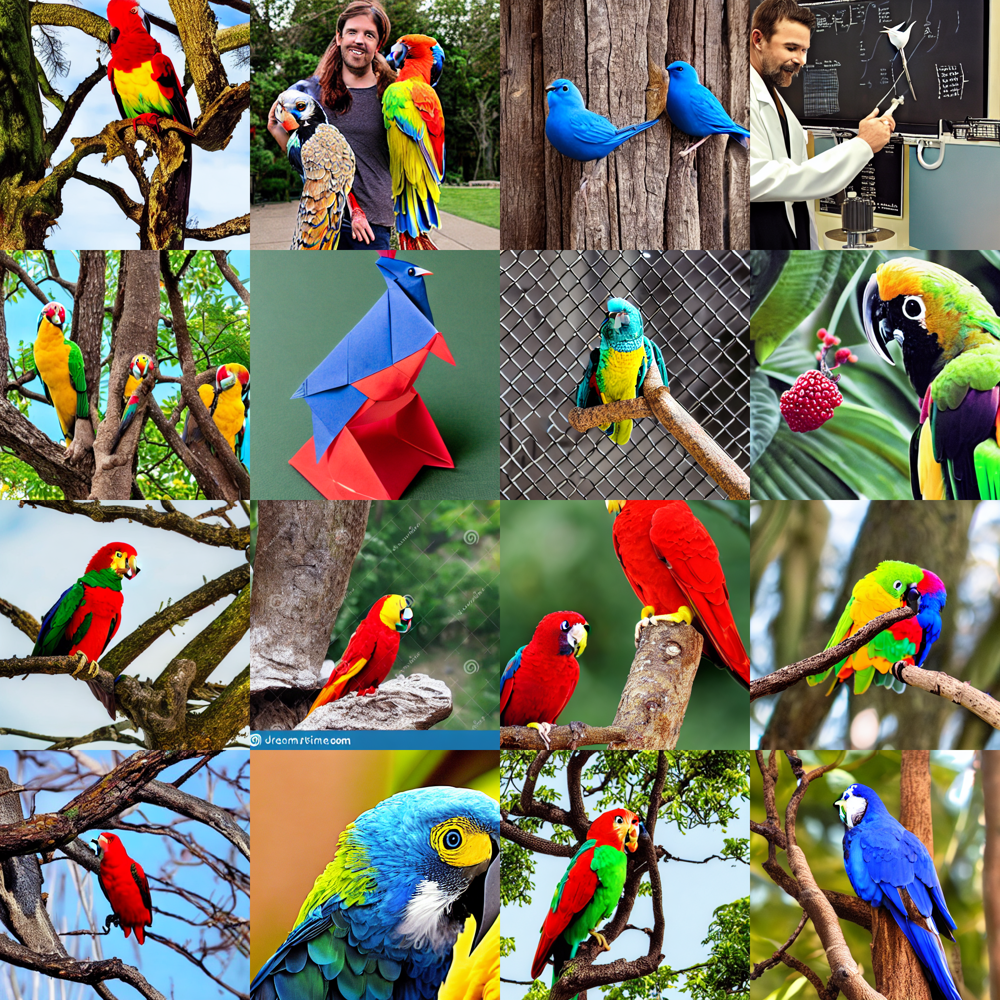

In [8]:
image_grid(images, rows=4, cols=4)

In [16]:
type(images[0])

PIL.Image.Image

In [15]:
save_path[0]

PosixPath('/home/datasets/ImageNet1K/ILSVRC/Data/CLS-LOC/generated_images/n01818515/n01818515_5350.png')

In [1]:
from PyNaver import Naver

client_id = "vT9YNwhYkejteUUnvfAG"
client_secret = "JuFqj_Am_G"

naver_translation = Naver(client_id, client_secret)

In [3]:
source = "ko"
target = "en"
text = "파이썬으로 파파고 번역 API를 호출해봅니다."

# 실행
res = naver_translation.papago_n2mt(source, target, text)
res

'Try calling the Papago translation API with Python.'

In [ ]:
import urllib.request
import urllib.parse
import json

text = '안녕. 뭐해?'
source = 'ko'
target = 'en'

encText = urllib.parse.quote(text)
data = f'source={source}&target={target}&text=' + encText

url = "https://openapi.naver.com/v1/papago/n2mt"
client_id = "vT9YNwhYkejteUUnvfAG"
client_secret = "JuFqj_Am_G"

request = urllib.request.Request(url)
request.add_header("X-Naver-Client-Id", client_id)
request.add_header("X-Naver-Client-Secret", client_secret)

response = urllib.request.urlopen(request, data=data.encode("utf-8"))
rescode = response.getcode()

if rescode == 200:
    response_body = response.read()
    decode = json.loads(response_body.decode('utf-8'))
    result = decode['message']['result']['translatedText']
    print(result)
else:
    print('Error Code:' + str(rescode))

In [1]:
import googletrans

translator = googletrans.Translator()

str1 = "나는 한국인 입니다."
str2 = "I like burger."
result1 = translator.translate(str1, dest='en')
result2 = translator.translate(str2, dest='ko')

print(f"나는 한국인 입니다. => {result1.text}")
print(f"I like burger. => {result2.text}")
##https://blockdmask.tistory.com/540

나는 한국인 입니다. => I'm a Korean.
I like burger. => 나는 버거를 좋아한다.
